# Cell type deconvolution for spatial transcriptomics
This pipeline is adjusted from the tutorial [here](https://cell2location.readthedocs.io/en/latest/notebooks/cell2location_tutorial.html).

## Prepare pipeline environment
To run this pipline, we recommend to use the docker contianer (https://cell2location.readthedocs.io/en/latest/dockersingularity.html) built by the cell2location developer. That page describes how to run the pipeline using docker. If you are using HPC, then it's recommended to run this pipeline using singularity. You can download the docker image using singularity with the command: <br/> 
> **singularity pull docker://quay.io/vitkl/cell2location:latest**. <br/>

Singularity image file is not writable, you can transfer it to a sandbox and then you will be able to install packages inside it without administrator role. The commands are:
> singularity build --sandbox cell2location cell2location.sif <br/>
> singularity run -w cell2location jupyter-lab --no-home --no-browser --port 8888

In the end, you can open jupyter-lab by copying and pasting the url shown in terminal.

# Load Packages

In [4]:
import scanpy as sc
import anndata
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import scanorama

import cell2location
import scvi
import glob
import os

from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42 # enables correct plotting of text for PDFs
plt.style.use('ggplot')

Global seed set to 0
/opt/conda/envs/cellpymc/lib/python3.7/site-packages/pytorch_lightning/utilities/warnings.py:54: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  "pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6"
/opt/conda/envs/cellpymc/lib/python3.7/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


In [5]:
import importlib
import utils.visium_modules as vis
importlib.reload(vis)

<module 'utils.visium_modules' from '/media/home/lis262/Code/scRNASeq_spatial/spatial_pipeline/utils/visium_modules.py'>

In [6]:
path = '/media/hpc/grid/wip_drm_targetsciences/projects/p051_senescence_esf'
# define result folder
results_folder = f'{path}/r02_cell2location/'

# create paths and names to results folders for reference regression and cell2location models
ref_run_name = f'{results_folder}/reference_signatures'
run_name = f'{results_folder}/cell2location_map'

# 1. Preprocessing
## 1.1 Read Data
### 1.1.1 read spatial data
* read in data, normalize, get highly variable genes
* change index to ensemble id to make sure spatial and reference scRNAseq can map gene perfectly
* remove mitochondria genes which are irrelevant for spatial mapping because their expression represents technical artifacts in the single cell and nucleus data rather than biological abundance of mitochondria. Yet these genes compose 15-40% of mRNA in each location.

In [7]:
path = '/media/hpc/grid/wip_drm_targetsciences/projects/p051_senescence_esf'
work_path = f'{path}/p01_visium_20220819/Analysis'
raw_path = f'{work_path}/f01_raw'
file_pres = [f for f in sorted(glob.glob(f'{raw_path}/*')) if os.path.isdir(f)]

adata_list, samples = vis.get_adata_list(file_pres)
vis.norm_hv_gene(adata_list)
vis.rm_mt_genes(adata_list)
vis.use_geneid_as_index(adata_list)

/opt/conda/envs/cellpymc/lib/python3.7/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/opt/conda/envs/cellpymc/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


## 1.2 integrate data using scanorama
### 1.2.1 Integrate

In [8]:
adata_list = adata_list[2:5] + adata_list[0:2]
adatas_cor = scanorama.correct_scanpy(adata_list, return_dimred=True)

Found 17943 genes among all datasets
[[0.         0.82276119 0.01611922 0.00565504 0.        ]
 [0.         0.         0.37895377 0.05819981 0.01962245]
 [0.         0.         0.         0.00801131 0.24574209]
 [0.         0.         0.         0.         0.        ]
 [0.         0.         0.         0.         0.        ]]
Processing datasets (0, 1)
Processing datasets (1, 2)
Processing datasets (2, 4)


/opt/conda/envs/cellpymc/lib/python3.7/site-packages/scanorama/scanorama.py:237: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = AnnData(datasets[i])


In [9]:
adata_scano = sc.concat(adatas_cor, label="library_id", uns_merge="unique",
    keys=[k for d in [ad.uns['spatial'] for ad in adatas_cor] for k, v in d.items()], index_unique="-",)
adata_scano.raw = adata_scano

### 1.2.2 Clustering and UMAP
Using leiden method on scanorama embeddings

In [10]:
sc.pp.neighbors(adata_scano, use_rep="X_scanorama")
sc.tl.umap(adata_scano)
sc.tl.leiden(adata_scano, key_added="clusters", resolution=1)

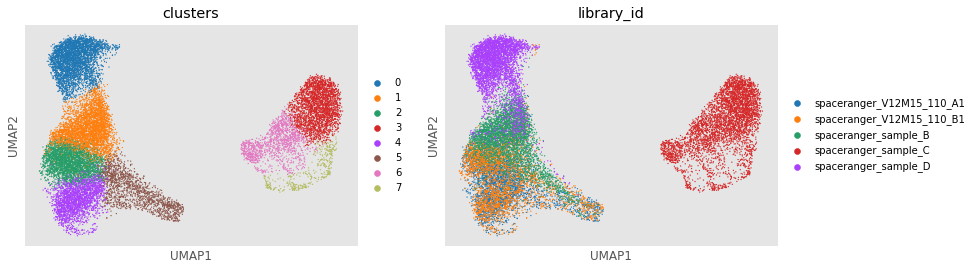

In [11]:
sc.pl.umap(adata_scano, color=["clusters", "library_id"], palette=sc.pl.palettes.default_20)

In [13]:
clusters_colors = dict(zip([str(i) for i in range(18)], adata_scano.uns["clusters_colors"]))

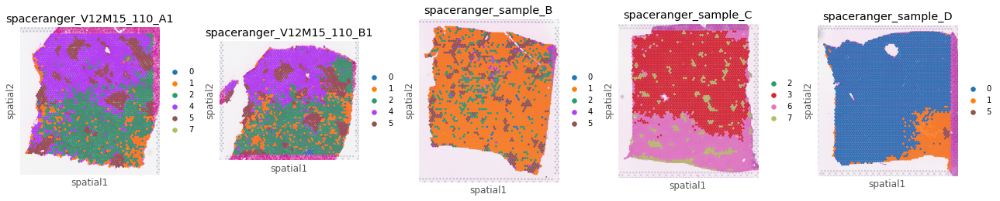

In [14]:
fig, axs = plt.subplots(1, len(adatas_cor), figsize=(18, 10))

for i, library in enumerate(adata_scano.uns['spatial'].keys()):
    ad = adata_scano[adata_scano.obs.library_id == library, :].copy()
    sc.pl.spatial(ad, img_key="hires", library_id=library, color="clusters", size=1.5,title=library,
                  palette=[v for k, v in clusters_colors.items() if k in ad.obs.clusters.unique().tolist()],
        show=False, ax=axs[i])
plt.tight_layout()

### 1.2.3 Change array back to raw count for cell2location

In [22]:
for ad in adata_list:
    ad.X =ad.layers['counts'].copy()

In [58]:
adata_spatial = sc.concat(adata_list, label="library_id", uns_merge="unique",merge='same',
    keys=[k for d in [ad.uns['spatial'] for ad in adata_list] for k, v in d.items()], index_unique="-",)
adata_spatial.raw = adata_spatial

## 1.2 Read scRNASeq data
Need to change index Ensembl gene id to make sure the index can match perfectly between scRNASeq and spatial data

In [15]:
sc_fn = f'{path}/r01_ref_scrna/liver_cirrohtic/liver_anno_ct.h5ad'
adata_ref = sc.read(sc_fn)
print('cell by gene:', adata_ref.shape)

cell by gene: (46953, 33694)


In [16]:
adata_ref.var['SYMBOL'] = adata_ref.var.index
# rename 'gene_ids' as necessary for your data
adata_ref.var.set_index('gene_ids', drop=True, inplace=True)
# delete unnecessary raw slot (to be removed in a future version of the tutorial)
# del adata_ref.raw

### 1.2.1 Filter genes
The anndata object for reference structure is: adata.X and adata.raw has log normalized data. adata.layers['counts'] has raw count. The selection step uses raw count data, so we need to copy the raw count data to adata.X
Select markers for each cell type. If the reference data is harmanized data, then probably should skip this step, because the values are batch corrected data.

/opt/conda/envs/cellpymc/lib/python3.7/site-packages/pandas/core/arraylike.py:364: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


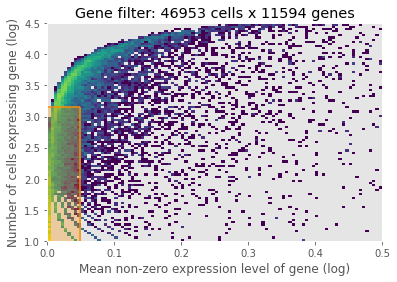

n_genes before filtering: 33694
n_genes after filtering: 11594


In [17]:
from cell2location.utils.filtering import filter_genes
adata_ref.X = adata_ref.layers['counts'].copy()
selected = filter_genes(adata_ref, cell_count_cutoff=5, cell_percentage_cutoff2=0.03, nonz_mean_cutoff=1.12)
# filter the object
print('n_genes before filtering:', adata_ref.shape[1])
adata_ref = adata_ref[:, selected].copy()
print('n_genes after filtering:', adata_ref.shape[1])

# 2 Estimation of reference cell type signatures (NB regression)

## !!! Attention, if you have alreadly run this step before and have the model and h5ad file ready, skip to step 3.

## 2.1 Prepare data for regression

In [8]:
# prepare anndata for the regression model
cell2location.models.RegressionModel.setup_anndata(adata=adata_ref,
        # 10X reaction / sample / batch
        batch_key='sample',
        # cell type, covariate used for constructing signatures
        labels_key='cell_type',
        # multiplicative technical effects (platform, 3' vs 5', donor effect)
        categorical_covariate_keys=['specimen_from_organism.diseases']
       )

## 2.2 Create the regression model

In [9]:
# create the regression model
from cell2location.models import RegressionModel
mod = RegressionModel(adata_ref)

# view anndata_setup as a sanity check
mod.view_anndata_setup()

Anndata setup with scvi-tools version 0.17.4.

Setup via `RegressionModel.setup_anndata` with arguments:

{
│   'layer': None,
│   'batch_key': 'sample',
│   'labels_key': 'cell_type',
│   'categorical_covariate_keys': ['specimen_from_organism.diseases'],
│   'continuous_covariate_keys': None
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│          n_vars          │ 11594 │
│         n_cells          │ 46953 │
│         n_batch          │  20   │
│         n_labels         │   9   │
│ n_extra_categorical_covs │   1   │
│ n_extra_continuous_covs  │   0   │
└──────────────────────────┴───────┘

                             Data Registry                             
┏━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Registry Key      ┃            scvi-tools Location             ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│           X            │                  adata.X                   │
│         batch          │          adata.obs['_scvi_batch']          │
│         labels         │         adata.obs['_scvi_labels']          │
│ extra_categorical_covs │ adata.obsm['_scvi_extra_categorical_covs'] │
│         ind_x          │           adata.obs['_indices']            │
└────────────────────────┴────────────────────────────────────────────┘

                            batch State Registry                            
┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃   Source Location   ┃          Categories          ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['sample'] │  GSM4041150_healthy1_cd45+   │          0          │
│                     │  GSM4041151_healthy1_cd45-A  │          1          │
│                     │  GSM4041152_healthy1_cd45-B  │          2          │
│                     │  GSM4041153_healthy2_cd45+   │          3          │
│                     │  GSM4041154_healthy2_cd45-   │          4          │
│                     │  GSM4041155_healthy3_cd45+   │          5          │
│                     │  GSM4041156_healthy3_cd45-A  │          6          │
│                     │  GSM4041157_healthy3_cd45-B  │          7          │
│                     │  GSM4041158_healthy4_cd45+   │          8          │
│                     │  GSM4041159_healthy4_cd45-   │          9          │
│                     │  GSM4041160_healthy5_cd45+   │         10          │
│                     │ GSM4041161_cirrhotic1_cd45+  │         11          │
│                     │ GSM4041162_cirrhotic1_cd45-A │         12          │
│                     │ GSM4041163_cirrhotic1_cd45-B │         13          │
│                     │ GSM4041164_cirrhotic2_cd45+  │         14          │
│                     │ GSM4041165_cirrhotic2_cd45-  │         15          │
│                     │ GSM4041166_cirrhotic3_cd45+  │         16          │
│                     │ GSM4041167_cirrhotic3_cd45-  │         17          │
│                     │ GSM4041168_cirrhotic4_cd45+  │         18          │
│                     │ GSM4041169_cirrhotic5_cd45+  │         19          │
└─────────────────────┴──────────────────────────────┴─────────────────────┘

                    labels State Registry                    
┏━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃    Source Location     ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['cell_type'] │   B cell   │          0          │
│                        │   CD4+_T   │          1          │
│                        │    Endo    │          2          │
│                        │ Epithelia  │          3          │
│                        │     MP     │          4          │
│                        │    Mes     │          5          │
│                        │     NK     │          6          │
│                        │   T cell   │          7          │
│                        │    pDC     │          8          │
└────────────────────────┴────────────┴─────────────────────┘

                                  extra_categorical_covs State Registry                                   
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃               Source Location                ┃            Categories             ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['specimen_from_organism.diseases'] │   alcoholic fatty liver disease   │          0          │
│                                              │ non-alcoholic fatty liver disease │          1          │
│                                              │              normal               │          2          │
│                                              │    primary biliary cholangitis    │          3          │
│                                              │                                   │                     │
└──────────────────────────────────────────────┴───────────────────────────────────┴─────────────────────┘

## 2.3 Train the model

In [10]:
mod.train(max_epochs=250, use_gpu=True)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/opt/conda/envs/cellpymc/lib/python3.7/site-packages/pytorch_lightning/trainer/configuration_validator.py:105: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Epoch 250/250: 100%|█| 250/250 [11:53<00:00,  2.89s/it, v_num=1, elbo_train=2.2e

`Trainer.fit` stopped: `max_epochs=250` reached.


Epoch 250/250: 100%|█| 250/250 [11:53<00:00,  2.86s/it, v_num=1, elbo_train=2.2e


Here, we plot ELBO loss history during training, removing first 20 epochs from the plot. This plot should have a decreasing trend and level off by the end of training. If it is still decreasing, increase max_epochs

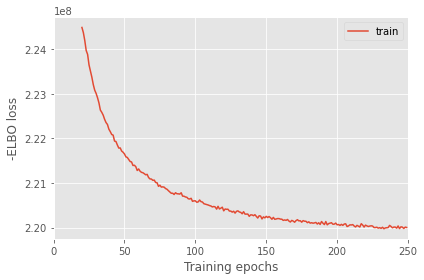

In [11]:
mod.plot_history(20)

In [12]:
# In this section, we export the estimated cell abundance (summary of the posterior distribution).
adata_ref = mod.export_posterior(
    adata_ref, sample_kwargs={'num_samples': 1000, 'batch_size': 2500, 'use_gpu': True}
)

# Save model
mod.save(f"{ref_run_name}", overwrite=True)

# Save anndata object with results
adata_file = f"{ref_run_name}/sc.h5ad"
adata_ref.write(adata_file)
print(adata_file)

Sampling global variables, sample: 100%|██████| 999/999 [00:13<00:00, 72.14it/s]
/media/hpc/grid/wip_drm_targetsciences/projects/p051_senescence_esf/r02_cell2location//reference_signatures/sc.h5ad


Examine QC plots.

Reconstruction accuracy to assess if there are any issues with inference. This 2D histogram plot should have most observations along a noisy diagonal.

The estimated expression signatures are distinct from mean expression in each cluster because of batch effects. For scRNA-seq datasets which do not suffer from batch effect (this dataset does), cluster average expression can be used instead of estimating signatures with a model. When this plot is very different from a diagonal plot (e.g. very low values on Y-axis, density everywhere) it indicates problems with signature estimation.

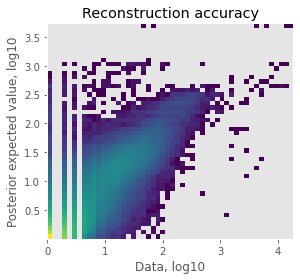

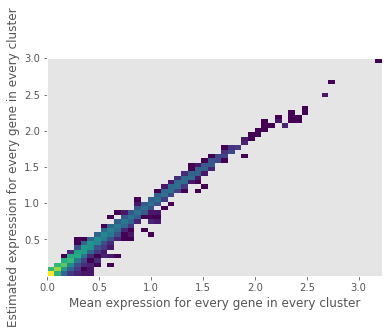

In [13]:
mod.plot_QC()

# 3. Load pre-existing model and anndata h5ad file
## !!! If you have run step 2 then skip this step

In [18]:
# load data and reference
adata_file = f"{ref_run_name}/sc.h5ad"
adata_ref = sc.read_h5ad(adata_file)
mod = cell2location.models.RegressionModel.load(f"{ref_run_name}", adata_ref)

INFO     File                                                                                                      
         /media/hpc/grid/wip_drm_targetsciences/projects/p051_senescence_esf/r02_cell2location//reference_signature
         s/model.pt already downloaded                                                                             


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/opt/conda/envs/cellpymc/lib/python3.7/site-packages/pytorch_lightning/trainer/configuration_validator.py:105: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Epoch 1/426:   0%| | 1/426 [00:01<12:17,  1.74s/it, v_num=1, elbo_train=2.36e+8]

`Trainer.fit` stopped: `max_steps=1` reached.


Epoch 1/426:   0%| | 1/426 [00:01<12:20,  1.74s/it, v_num=1, elbo_train=2.36e+8]


# 4. Deconvolution

## 4.1 Extract signature gene expression
All parameters of the a Negative Binomial regression model are exported into reference anndata object, however for spatial mapping we just need the estimated expression of every gene in every cell type. Here we extract that from standard output:

In [17]:
# export estimated expression in each cluster
if 'means_per_cluster_mu_fg' in adata_ref.varm.keys():
    inf_aver = adata_ref.varm['means_per_cluster_mu_fg'][[f'means_per_cluster_mu_fg_{i}'
                                    for i in adata_ref.uns['mod']['factor_names']]].copy()
else:
    inf_aver = adata_ref.var[[f'means_per_cluster_mu_fg_{i}'
                                    for i in adata_ref.uns['mod']['factor_names']]].copy()
inf_aver.columns = adata_ref.uns['mod']['factor_names']
inf_aver.iloc[0:5, :]

,B cell,CD4+_T,Endo,Epithelia,MP,Mes,NK,T cell,pDC
gene_ids,,,,,,,,,
ENSG00000279457,0.080668,0.075287,0.135862,0.250158,0.164336,0.237017,0.074902,0.067576,0.175214
ENSG00000228463,0.060176,0.060253,0.144607,0.150112,0.126630,0.291681,0.054190,0.051040,0.095562
ENSG00000237491,0.034084,0.012244,0.017830,0.033882,0.045973,0.076187,0.020296,0.015022,0.014506
ENSG00000187634,0.001446,0.000576,0.016752,0.002293,0.000400,0.096938,0.000370,0.000240,0.003441
ENSG00000188976,0.131933,0.093743,0.156316,0.223520,0.126060,0.150716,0.113021,0.091947,0.177961


## 4.2 Spatial mapping
Find shared genes and prepare anndata. Subset both anndata and reference signatures:

In [31]:
# find shared genes and subset both anndata and reference signatures
intersect = np.intersect1d(adata_spatial.var_names, inf_aver.index)
adata_spatial = adata_spatial[:, intersect].copy()
inf_aver = inf_aver.loc[intersect, :].copy()

# prepare anndata for cell2location model
cell2location.models.Cell2location.setup_anndata(adata=adata_spatial, batch_key="sample")

Important
To use cell2location spatial mapping model, you need to specify 2 user-provided hyperparameters (N_cells_per_location and detection_alpha) - for detailed guidance on setting these hyperparameters and their impact see the flow diagram and the note.

In [32]:
# create and train the model
mod = cell2location.models.Cell2location(
    adata_spatial, cell_state_df=inf_aver,
    # the expected average cell abundance: tissue-dependent
    # hyper-prior which can be estimated from paired histology:
    N_cells_per_location=30,
    # hyperparameter controlling normalisation of
    # within-experiment variation in RNA detection:
    detection_alpha=20
)
mod.view_anndata_setup()

Anndata setup with scvi-tools version 0.17.4.

Setup via `Cell2location.setup_anndata` with arguments:

{
│   'layer': None,
│   'batch_key': 'sample',
│   'labels_key': None,
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': None
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│          n_vars          │ 10177 │
│         n_cells          │ 18045 │
│         n_batch          │   5   │
│         n_labels         │   1   │
│ n_extra_categorical_covs │   0   │
│ n_extra_continuous_covs  │   0   │
└──────────────────────────┴───────┘

               Data Registry                
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Registry Key ┃    scvi-tools Location    ┃
┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      X       │          adata.X          │
│    batch     │ adata.obs['_scvi_batch']  │
│    labels    │ adata.obs['_scvi_labels'] │
│    ind_x     │   adata.obs['_indices']   │
└──────────────┴───────────────────────────┘

                          batch State Registry                           
┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃   Source Location   ┃        Categories         ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['sample'] │ spaceranger_V12M15_110_A1 │          0          │
│                     │ spaceranger_V12M15_110_B1 │          1          │
│                     │   spaceranger_sample_B    │          2          │
│                     │   spaceranger_sample_C    │          3          │
│                     │   spaceranger_sample_D    │          4          │
└─────────────────────┴───────────────────────────┴─────────────────────┘

                     labels State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_labels'] │     0      │          0          │
└───────────────────────────┴────────────┴─────────────────────┘

In [36]:
mod.train(max_epochs=30000,
          # train using full data (batch_size=None)
          batch_size=None,
          # use all data points in training because
          # we need to estimate cell abundance at all locations
          train_size=1,
          use_gpu=True)

# plot ELBO loss history during training, removing first 100 epochs from the plot
mod.plot_history(1000)
plt.legend(labels=['full data training']);

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/opt/conda/envs/cellpymc/lib/python3.7/site-packages/pytorch_lightning/trainer/configuration_validator.py:105: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]
/opt/conda/envs/cellpymc/lib/python3.7/site-packages/pytorch_lightning/trainer/trainer.py:1896: PossibleUserWarning: The number of training batches (1) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
  category=PossibleUserWarning,


Epoch 337/30000:   1%| | 336/30000 [05:32<8:09:29,  1.01it/s, v_num=1, elbo_trai
Epoch 20058/30000:  67%|▋| 20057/30000 [1:38:11<49:43,  3.33it/s, v_num=1, elbo_

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Epoch 23724/30000:  79%|▊| 23724/30000 [1:56:08<30:24,  3.44it/s, v_num=1, elbo_

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Epoch 27488/30000:  92%|▉| 27487/30000 [2:14:35<12:10,  3.44it/s, v_num=1, elbo_

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



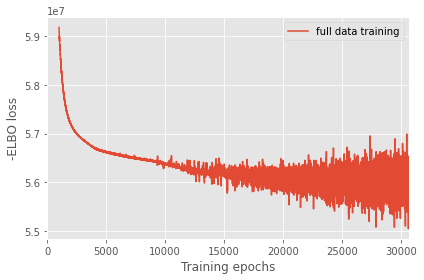

In [39]:
# plot ELBO loss history during training, removing first 100 epochs from the plot
mod.plot_history(1000)
plt.legend(labels=['full data training']);

Exporting estimated posterior distributions of cell abundance and saving results:

In [41]:
# In this section, we export the estimated cell abundance (summary of the posterior distribution).
adata_spatial = mod.export_posterior(
    adata_spatial, sample_kwargs={'num_samples': 1000, 'batch_size': mod.adata.n_obs, 'use_gpu': True}
)

# Save model
mod.save(f"{run_name}", overwrite=True)

# mod = cell2location.models.Cell2location.load(f"{run_name}", adata_vis)

# Save anndata object with results
adata_file = f"{run_name}/sp.h5ad"
adata_spatial.write(adata_file)
print(adata_file)

Sampling global variables, sample: 100%|██████| 999/999 [00:47<00:00, 20.92it/s]
/media/hpc/grid/wip_drm_targetsciences/projects/p051_senescence_esf/r02_cell2location//cell2location_map/sp.h5ad


# 5. Load trained mapping model
## !!! If you have run step 4, skip this step

In [19]:
# to load the known data
adata_file = f"{run_name}/sp.h5ad"
adata_spatial = sc.read_h5ad(adata_file)
mod = cell2location.models.Cell2location.load(f"{run_name}", adata_spatial)

INFO     File                                                                                                      
         /media/hpc/grid/wip_drm_targetsciences/projects/p051_senescence_esf/r02_cell2location//cell2location_map/m
         odel.pt already downloaded                                                                                


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/opt/conda/envs/cellpymc/lib/python3.7/site-packages/pytorch_lightning/trainer/configuration_validator.py:105: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]
/opt/conda/envs/cellpymc/lib/python3.7/site-packages/pytorch_lightning/trainer/trainer.py:1896: PossibleUserWarning: The number of training batches (1) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
  category=PossibleUserWarning,


Epoch 1/30000:   0%| | 1/30000 [00:00<2:21:07,  3.54it/s, v_num=1, elbo_train=1.

`Trainer.fit` stopped: `max_steps=1` reached.


Epoch 1/30000:   0%| | 1/30000 [00:00<2:23:25,  3.49it/s, v_num=1, elbo_train=1.


Sampling global variables, sample: 100%|██████| 999/999 [00:16<00:00, 59.77it/s]


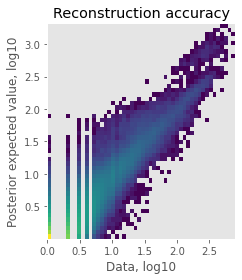

In [25]:
mod.export_posterior(adata_spatial)
mod.plot_QC()

When intergrating multiple spatial batches and when working with datasets that have substantial variation of detected RNA within slides (that cannot be explained by high cellular density in the histology), it is important to assess whether cell2location normalised those effects. You expect to see similar total cell abundance across batches but distinct RNA detection sensitivity (both estimated by cell2location). You expect total cell abundance to mirror high cellular density in the histology.

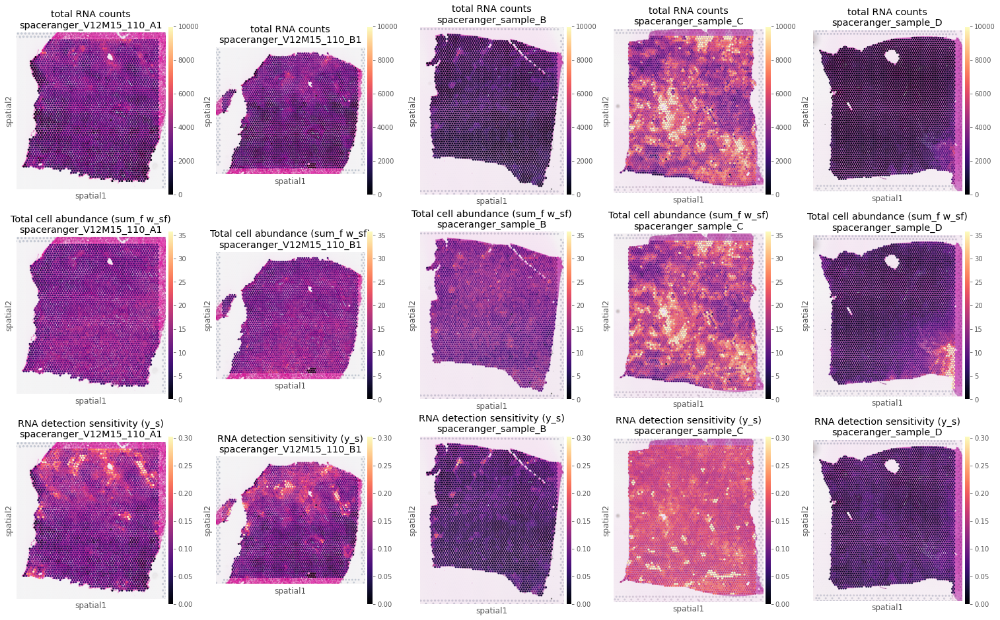

In [47]:
fig = mod.plot_spatial_QC_across_batches()

# 6. Visualising cell abundance in spatial coordinates
We use 5% quantile of the posterior distribution, representing the value of cell abundance that the model has high confidence in (aka ‘at least this amount is present’).

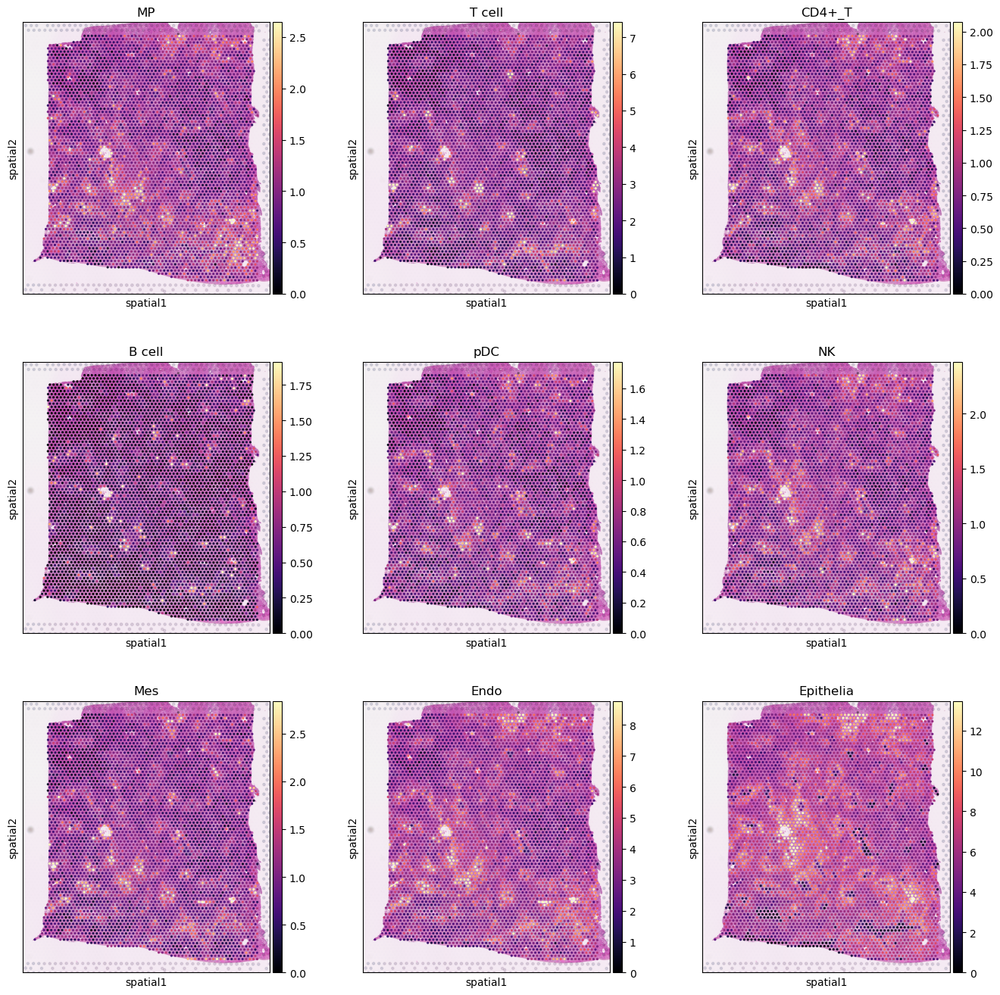

In [75]:
# add 5% quantile, representing confident cell abundance, 'at least this amount is present',
# to adata.obs with nice names for plotting
adata_spatial.obs[adata_spatial.uns['mod']['factor_names']] = adata_spatial.obsm['q05_cell_abundance_w_sf']

# select one slide
from cell2location.utils import select_slide
slide = select_slide(adata_spatial, 'spaceranger_sample_C')

cells = adata_ref.obs['cell_type'].unique().tolist()
# plot in spatial coordinates
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4.5, 5]}):

    sc.pl.spatial(slide, cmap='magma',
                  # show first 8 cell types
                  color=cells,
                  ncols=3, size=1,
                  img_key='hires',
                  # limit color scale at 99.2% quantile of cell abundance
                  vmin=0, vmax='p99.2'
                 )

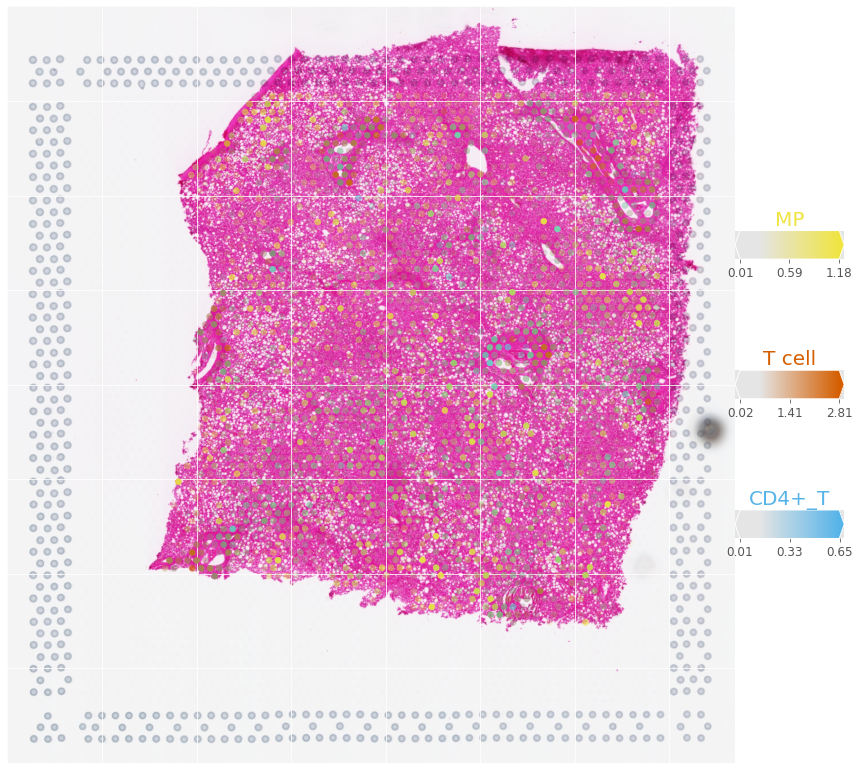

In [63]:
# Now we use cell2location plotter that allows showing multiple cell types in one panel
from cell2location.plt import plot_spatial

# select up to 6 clusters
cells = adata_ref.obs['cell_type'].unique().tolist()

clust_labels = cells[:3]
clust_col = ['' + str(i) for i in clust_labels] # in case column names differ from labels

slide = select_slide(adata_spatial, 'spaceranger_V12M15_110_A1')

with mpl.rc_context({'figure.figsize': (15, 15)}):
    fig = plot_spatial(
        adata=slide,
        # labels to show on a plot
        color=clust_col, labels=clust_labels,
        show_img=True,
        # 'fast' (white background) or 'dark_background'
        style='fast',
        # limit color scale at 99.2% quantile of cell abundance
        max_color_quantile=0.992,
        # size of locations (adjust depending on figure size)
        circle_diameter=6,
        colorbar_position='right'
    )

# 7. Downstream analysis
## 7.1 Identifying discrete tissue regions by Leiden clustering
Here we use scanorama to remove batch effect and then copy the cluster annotation to the  

In [76]:
adata_spatial.obs = pd.merge(adata_spatial.obs, adata_scano.obs['clusters'],left_index=True,right_index=True,how='left')

In [27]:
# # compute KNN using the cell2location output stored in adata.obsm
# sc.pp.neighbors(adata_spatial, use_rep='q05_cell_abundance_w_sf',
#                 n_neighbors = 15)

# # Cluster spots into regions using scanpy
# sc.tl.leiden(adata_spatial, resolution=1.1)

# # add region as categorical variable
# adata_spatial.obs["region_cluster"] = adata_spatial.obs["leiden"].astype("category")

## 7.2 Identifying cellular compartments / tissue zones using matrix factorisation (NMF)
Here, we use the cell2location mapping results to identify the spatial co-occurrence of cell types in order to better understand the tissue organisation and predict cellular interactions. We performed non-negative matrix factorization (NMF) of the cell type abundance estimates from cell2location (paper section 4, Fig 4D). Similar to the established benefits of applying NMF to conventional scRNA-seq, the additive NMF decomposition yielded a grouping of spatial cell type abundance profiles into components that capture co-localised cell types (Supplemenary Methods section 4.2, p. 60). This NMF-based decomposition naturally accounts for the fact that multiple cell types and microenvironments can co-exist at the same Visium locations (see paper Fig S20, p. 34), while sharing information across tissue areas (e.g. individual germinal centres).

In [78]:
from cell2location import run_colocation
res_dict, adata_spatial = run_colocation(
    adata_spatial,
    model_name='CoLocatedGroupsSklearnNMF',
    train_args={
      'n_fact': np.arange(11, 13), # IMPORTANT: use a wider range of the number of factors (5-30)
      'sample_name_col': 'sample', # columns in adata_spatial.obs that identifies sample
      'n_restarts': 3 # number of training restarts
    },
    export_args={'path': f'{run_name}/CoLocatedComb/'}
)

### Analysis name: CoLocatedGroupsSklearnNMF_11combinations_18045locations_9factors


/opt/conda/envs/cellpymc/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 20000 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)
/opt/conda/envs/cellpymc/lib/python3.7/site-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/opt/conda/envs/cellpymc/lib/python3.7/site-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/opt/conda/envs/cellpymc/lib/python3.7/site-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/opt/conda/envs/cellpymc/lib/python3.7/site-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


### Analysis name: CoLocatedGroupsSklearnNMF_12combinations_18045locations_9factors


/opt/conda/envs/cellpymc/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 20000 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)
/opt/conda/envs/cellpymc/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 20000 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)
/opt/conda/envs/cellpymc/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 20000 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)
/opt/conda/envs/cellpymc/lib/python3.7/site-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/opt/conda/envs/cellpymc/lib/python3.7/site-packages/numpy/lib/function_base.py:2692: Runtime

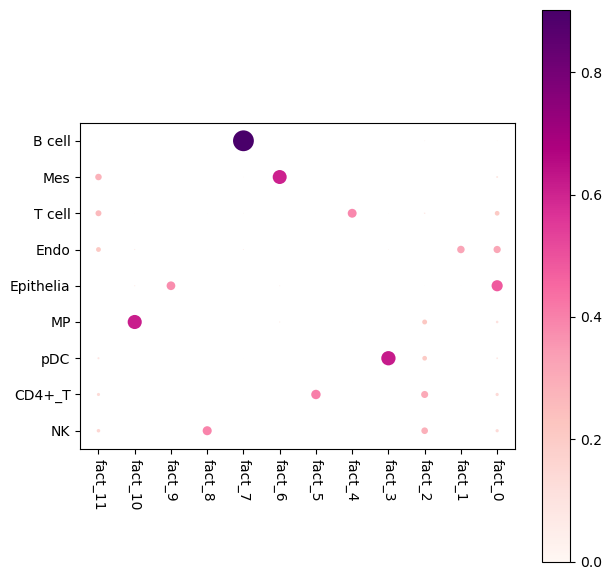

In [36]:
# Here we plot the NMF weights (Same as saved to `cell_type_fractions_heatmap`)
res_dict['n_fact12']['mod'].plot_cell_type_loadings()

## 7.3 Estimate cell-type specific expression of every gene in the spatial data (needed for NCEM)
The cell-type specific expression of every gene at every spatial location in the spatial data enables learning cell communication with NCEM model using Visium data (https://github.com/theislab/ncem).

In [79]:
# Compute expected expression per cell type
expected_dict = mod.module.model.compute_expected_per_cell_type(
    mod.samples["post_sample_q05"], mod.adata_manager
)

# Add to anndata layers
for i, n in enumerate(mod.factor_names_):
    adata_spatial.layers[n] = expected_dict['mu'][i]

# Save anndata object with results
adata_file = f"{run_name}/sp.h5ad"
adata_spatial.write(adata_file)
print(adata_file)

/media/hpc/grid/wip_drm_targetsciences/projects/p051_senescence_esf/r02_cell2location//cell2location_map/sp.h5ad


In [84]:
adata_ref.obs['cell_type'].unique().tolist()

['MP', 'T cell', 'CD4+_T', 'B cell', 'pDC', 'NK', 'Mes', 'Endo', 'Epithelia']

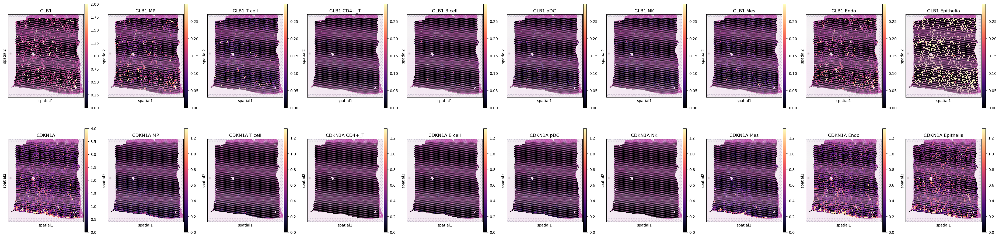

In [86]:
# list cell types and genes for plotting
ctypes = adata_ref.obs['cell_type'].unique().tolist()
genes = ['GLB1','CDKN1A']

with mpl.rc_context({'axes.facecolor':  'black'}):
    # select one slide
    slide = select_slide(adata_spatial, 'spaceranger_sample_C')

    from utils.cell2loc_util import plot_genes_per_cell_type
    plot_genes_per_cell_type(slide, genes, ctypes);